In [ ]:
%pip install requests BeautifulSoup

### 1. Scraping the Website https://wheeloffortuneanswer.com/ for Puzzle Data

##### 1.1 Fetching Category names and the hyperlinks for category pages containing word phrases for each category

In [ ]:
import requests
from bs4 import BeautifulSoup
import csv

# Getting page content
base_url = 'https://wheeloffortuneanswer.com/'
response = requests.get(base_url)
soup = BeautifulSoup(response.content, 'html.parser')

# Dictionary to store {category_name: category_url}
categories = {}

# Finding the table and filtering only rows inside the table body
table = soup.find('table', class_='tablepress tablepress-id-73')
if table:
    tbody = table.find('tbody')
    if tbody:
        for row in tbody.find_all('tr'):
            td = row.find_all('td')  # Extract all the td elements in the row
            if len(td) > 1:  # Make sure the row has enough columns
                category_name = td[0].get_text(strip=True)  # Category name is in the first td
                category_link = td[0].find('a', href=True)  # Link is inside the first td within <a> tags
                if category_link:
                    categories[category_name] = category_link['href']  # Store the category name and link

# Number of category names with links
print(f'Number of categories: {len(categories)}')



Number of categories: 50


In [7]:
categories

{'Around the House': 'https://wheeloffortuneanswer.com/around-the-house/',
 'Before and After': 'https://wheeloffortuneanswer.com/before-and-after/',
 'Book Title (Best Seller)': 'https://wheeloffortuneanswer.com/book-title/',
 'Classic Movie': 'https://wheeloffortuneanswer.com/classic-movie/',
 'Classic TV': 'https://wheeloffortuneanswer.com/classic-tv/',
 'College Life': 'https://wheeloffortuneanswer.com/college-life/',
 'Event': 'https://wheeloffortuneanswer.com/event/',
 'Family': 'https://wheeloffortuneanswer.com/family/',
 'Fictional Character': 'https://wheeloffortuneanswer.com/fictional-character/',
 'Fictional Place': 'https://wheeloffortuneanswer.com/fictional-place/',
 'Food and Drink': 'https://wheeloffortuneanswer.com/food-and-drink/',
 'Fun and Games': 'https://wheeloffortuneanswer.com/fun-and-games/',
 'Headline': 'https://wheeloffortuneanswer.com/headline/',
 'Husband and Wife': 'https://wheeloffortuneanswer.com/husband-and-wife/',
 'In the Kitchen': 'https://wheeloffor

##### 1.2 Visiting each category and extracting phrases

In [ ]:
results = []

#Looping through each category_name to extract phrases under the category
for category, cat_url in categories.items():
    print(f"Processing category: {category}")
    
    res = requests.get(cat_url)
    soup = BeautifulSoup(res.content, 'html.parser')

    # Find the tbody with the known class
    tbody = soup.find('tbody', class_='row-striping')
    if tbody:
        rows = tbody.find_all('tr')  # Find all rows inside the tbody

        for row in rows:
            cols = row.find_all('td')
            if len(cols) >= 1:
                phrase = cols[0].get_text(strip=True)
                if phrase:
                    results.append([category, phrase])

Processing category: Around the House
Processing category: Before and After
Processing category: Book Title (Best Seller)
Processing category: Classic Movie
Processing category: Classic TV
Processing category: College Life
Processing category: Event
Processing category: Family
Processing category: Fictional Character
Processing category: Fictional Place
Processing category: Food and Drink
Processing category: Fun and Games
Processing category: Headline
Processing category: Husband and Wife
Processing category: In the Kitchen
Processing category: Landmark
Processing category: Living Thing
Processing category: Megaword
Processing category: Movie Quotes
Processing category: Movie Title
Processing category: Occupation
Processing category: On the Map
Processing category: People
Processing category: Person
Processing category: Phrase
Processing category: Place
Processing category: Proper Name
Processing category: Quotation
Processing category: Rhyme Time
Processing category: Rock On
Processi

In [13]:
results

[['Around the House', 'A Glass Of Bourbon'],
 ['Around the House', 'A Nice Hot Shower'],
 ['Around the House', 'A Pile Of Coats'],
 ['Around the House', 'A Pile Of Coats On The Bed'],
 ['Around the House', 'A Shelf Full Of Knickknacks'],
 ['Around the House', 'A Sock With Holes In It'],
 ['Around the House', 'A Vase Filled With Sunflowers'],
 ['Around the House', 'A Vase Of Flowers'],
 ['Around the House', 'A Vase Of Fresh Cut Garden Flowers'],
 ['Around the House', 'Accent Cabinet'],
 ['Around the House', 'Accent Furniture'],
 ['Around the House', 'Accent Window'],
 ['Around the House', 'Address Book'],
 ['Around the House', 'Address Labels'],
 ['Around the House', 'Adjustable Shoe Rack'],
 ['Around the House', 'Adjustable Swivel Stool'],
 ['Around the House', 'Afghan Rug'],
 ['Around the House', 'After- Shave Lotion'],
 ['Around the House', 'After-Shave Lotion'],
 ['Around the House', 'Air Conditioning'],
 ['Around the House', 'Air Freshener'],
 ['Around the House', 'Air Mattress'],


##### 1.3 Saving reslts to csv

In [18]:
with open('Nantume.csv', 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerow(['Puzzle_Category', 'Word_To_Guess'])
    writer.writerows(results)

print("Completed! Data saved to 'Nantume.csv'")


Completed! Data saved to 'Nantume.csv'


#### 2. Visualising "Word_To_Guess' per Puzzle_Category using Word Cloud

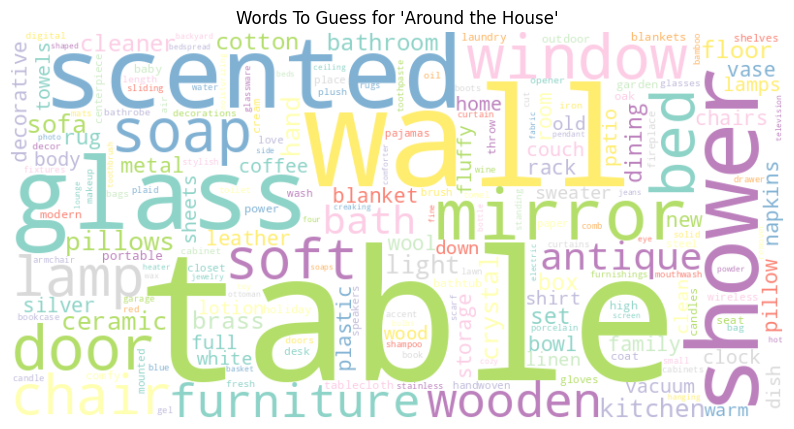

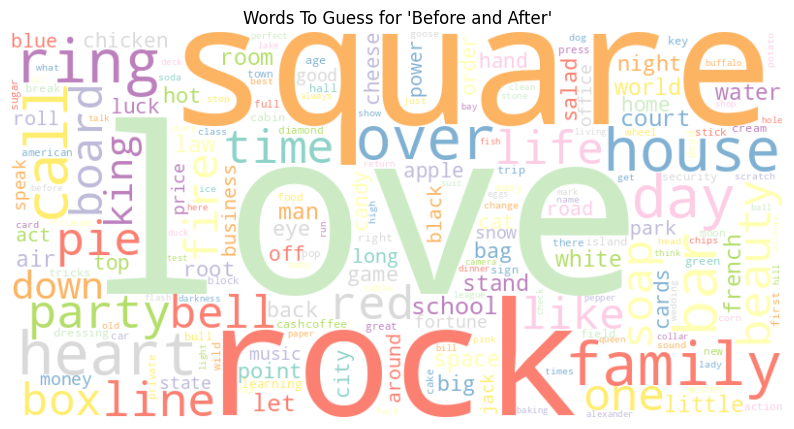

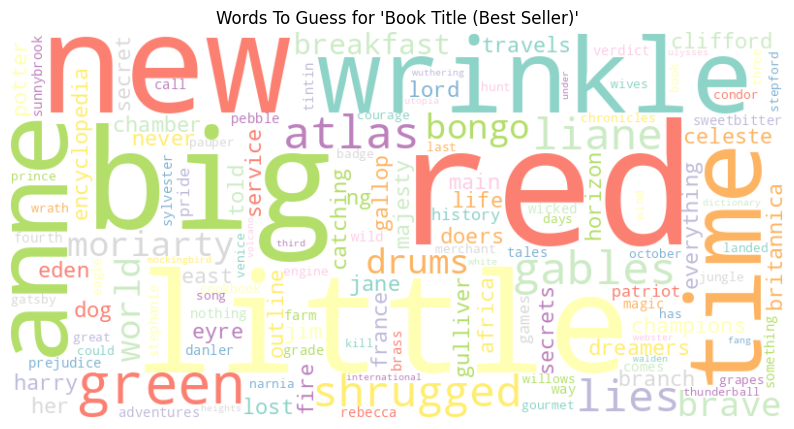

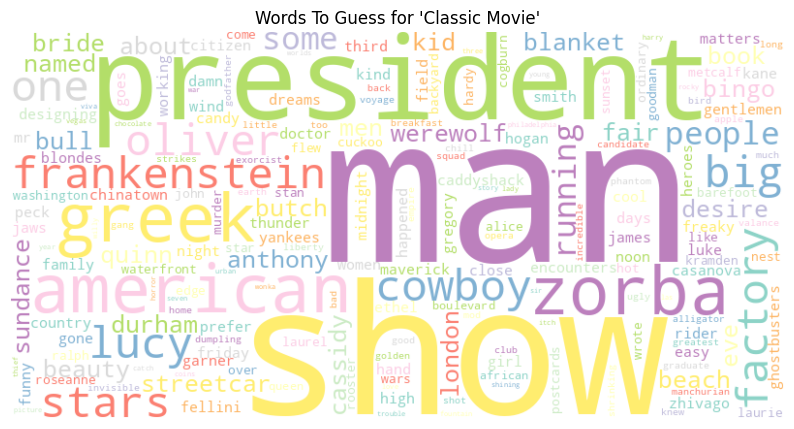

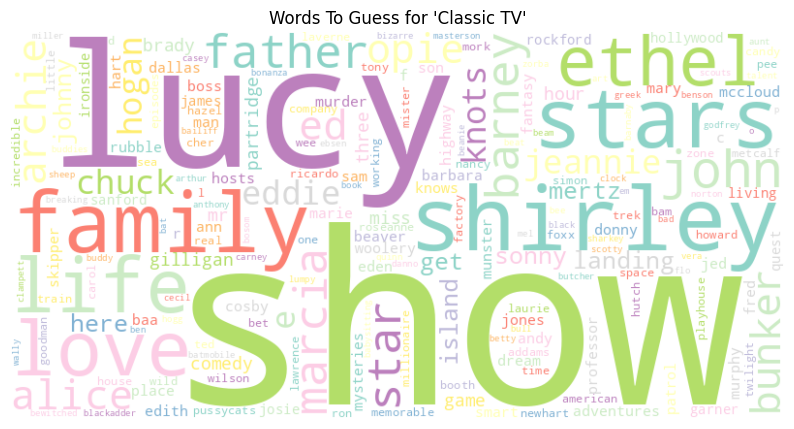

...

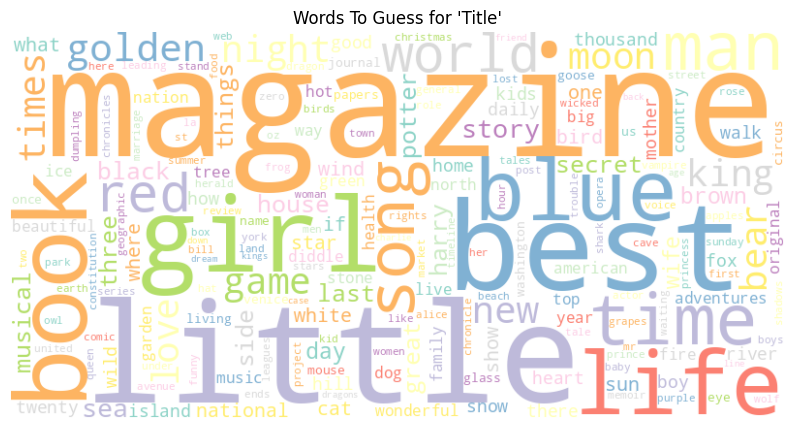

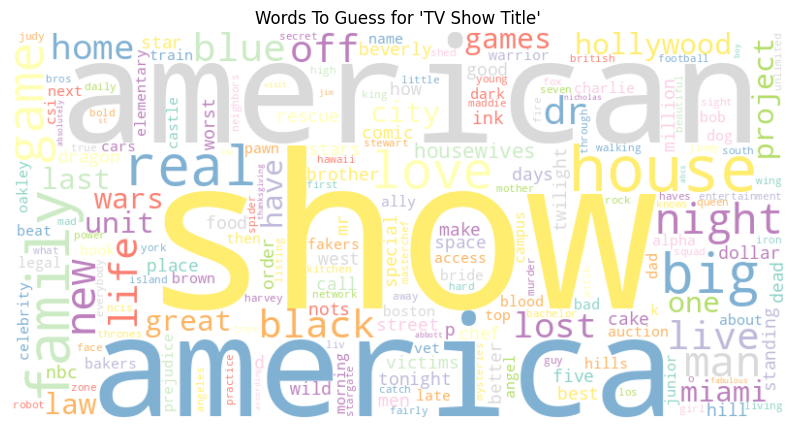

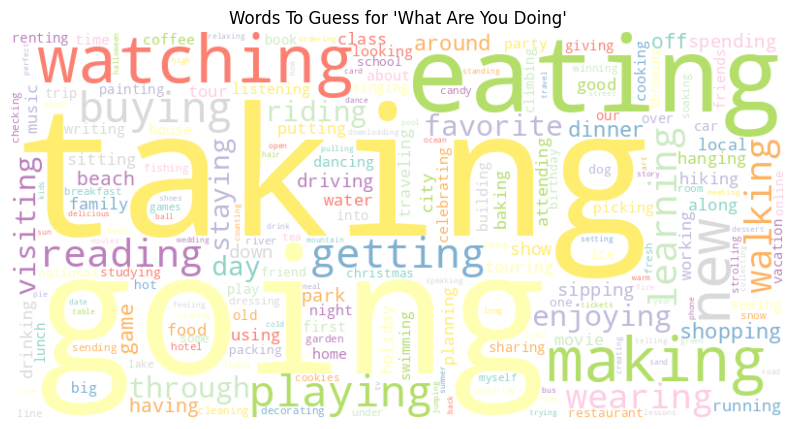

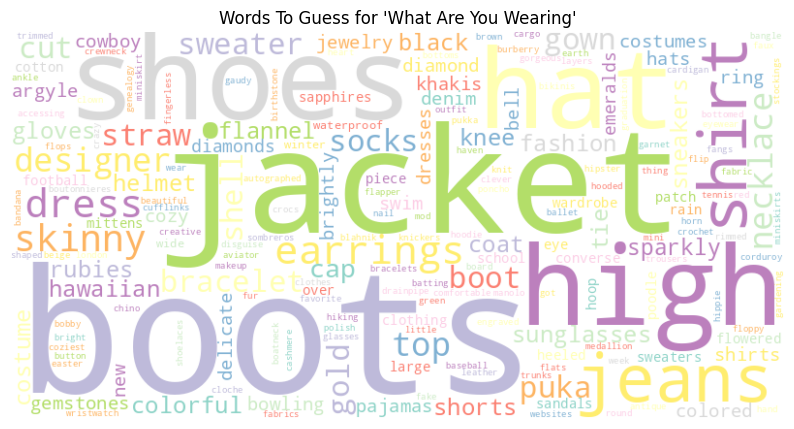

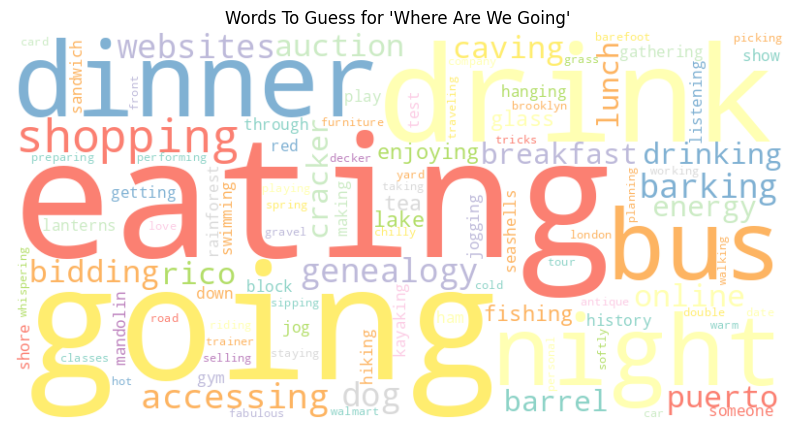

In [61]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import re
from wordcloud import WordCloud

# Defining common stopwords
stopwords = {'a', 'an', 'the', 'of', 'in', 'on', 'by', 'and', 'is', 'to', 'for', 'with', 'at', 'from', 
             'as', 'that', 'this', 'it', 'be', 'they', 'your', 'are', 'was', 'were', 'but', 'or', 'so', 
             's', 'up', 'out', 'my', 'i', 'you', 't', 'go', 'me', 'we', 'm', 'll', 'he', 'can', 'she', 
             'who', 'all', 'do', 'no', 'don', 'not', 'did', 'very', 're',}

# Loading the CSV into a DataFrame
df = pd.read_csv(r'D:\Data Mining\Data Mining Exam\Part C\Nantume.csv')

# Initialize a list to store category names and their most common words
category_words = []

# Processing data to find the most common non-stopword per category
for category in df['Puzzle_Category'].unique():
    # Getting all phrases under this category
    phrases = df[df['Puzzle_Category'] == category]['Word_To_Guess']
    
    # Combining all phrases into a single string
    all_words = ' '.join(phrases).lower()
    
    # Extracting individual words
    words = re.findall(r'\b\w+\b', all_words)
    
    # Remove stopwords
    filtered_words = [word for word in words if word not in stopwords]
    
    # Count word frequencies
    word_counts = Counter(filtered_words)
    
    if word_counts:
        # Create a word cloud for the current category
        wordcloud = WordCloud(stopwords=stopwords, width=800, height=400, background_color='white', 
                          colormap='Set3').generate_from_frequencies(word_counts)
        
        # Plot the word cloud
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Words To Guess for '{category}'")
        plt.show()

        # Storing the most common word and its frequency for the table
        most_common_word, count = word_counts.most_common(1)[0]
        category_words.append((category, most_common_word, count))

    else:
        category_words.append((category, None, 0))


In [60]:
# Converting results into a DataFrame
category_df = pd.DataFrame(category_words, columns=['Puzzle_Category', 'Word_To_Guess', 'Frequency'])
category_df

,Puzzle_Category,Word_To_Guess,Frequency
0,Around the House,table,54
1,Before and After,love,31
2,Book Title (Best Seller),red,3
3,Classic Movie,man,4
4,Classic TV,show,19
5,College Life,majoring,4
6,Event,trip,253
7,Family,brothers,4
8,Fictional Character,goddess,27
9,Fictional Place,city,2
